In [2]:
import pandas as pd
import numpy as np

In [3]:
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

In [4]:
%pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [5]:
def preprocess_data(df):
    df_cleaned = df.copy()
    df_cleaned = df_cleaned.dropna(how='any') # drop empty columns

    numeric_columns = df_cleaned.select_dtypes(include=['float64', 'int64']).columns
    scaler = StandardScaler()
    df_cleaned[numeric_columns] = scaler.fit_transform(df_cleaned[numeric_columns])

    df_cleaned['result'] = (df_cleaned['goals_scored'] > df_cleaned['goals_conceded']).astype(int)
    
    # Create categorical result column (win, draw, loss)
    df_cleaned['result_category'] = 'draw'
    df_cleaned.loc[df_cleaned['goals_scored'] > df_cleaned['goals_conceded'], 'result_category'] = 'win'
    df_cleaned.loc[df_cleaned['goals_scored'] < df_cleaned['goals_conceded'], 'result_category'] = 'loss'
    
    return df_cleaned



In [6]:
import matplotlib.pyplot as plt

In [7]:
import seaborn as sns

In [8]:
def visualise(df):
    correlation_matrix = df.corr()
    
    plt.figure(figsize = (12, 10))
    sns.heatmap(correlation_matrix, annot = True, cmap = 'coolwarm')
    plt.title("Correlation Matrix")
    plt.show()

In [9]:
df = pd.read_csv('CCFC_match_lineups_data.csv')

In [10]:
df = preprocess_data(df)

In [11]:
def visualise_correlation_matrix(df):
    numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
    correlation_matrix = df[numeric_columns].corr()
    plt.figure(figsize=(120, 100))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
    plt.title('Correlation Matrix for Numerical Features')
    plt.show()

In [12]:
plt.rcParams.update({'font.size': 32})

visualise_correlation_matrix(df)

In [13]:
def visualise_box_plots(df):
    plt.figure(figsize=(15,10))
    numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
    sns.boxplot(data=df[numeric_columns])
    plt.title("Box plot for Numerical Features")
    plt.xticks(rotation=90)
    plt.show()

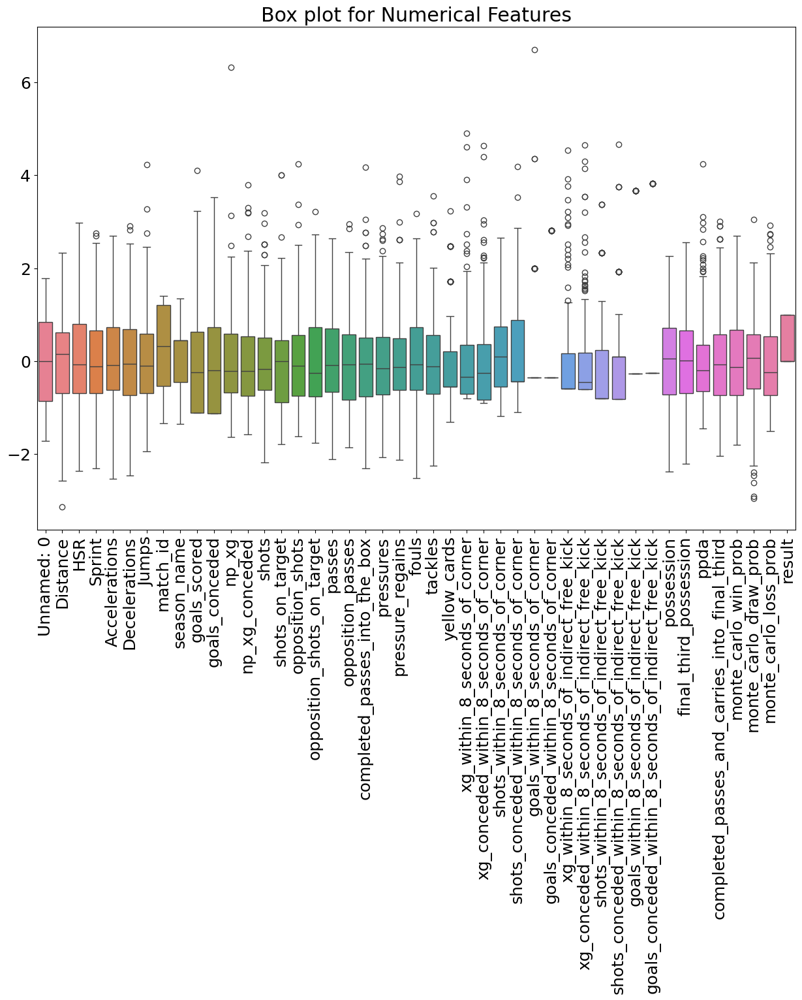

In [14]:
plt.rcParams.update({'font.size': 18})

visualise_box_plots(df)

In [15]:
def visualise_distributions(df):
    plt.figure(figsize=(65,10))
    numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
    for i, col in enumerate(numeric_columns):
        plt.subplot(9, 5, i+1)
        sns.histplot(df[col], kde=True)
        plt.title(f'{col}')
    plt.tight_layout()
    plt.show()

/var/folders/wq/tzw6jv353p17sszk1kcpm1ym0000gp/T/ipykernel_68429/1510636642.py:8: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


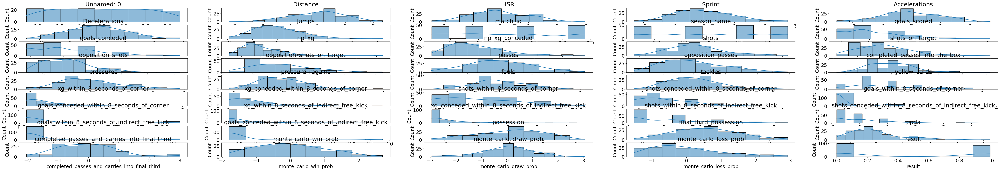

In [16]:
visualise_distributions(df)

In [17]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def create_analysis_visualizations(df, output_cols=None):
    """
    Creates a comprehensive set of visualizations for football statistics analysis.
    
    Parameters:
    df: pandas DataFrame containing football statistics
    output_cols: list of specific columns to analyze (defaults to all numeric columns)
    """
    # If no columns specified, use all numeric columns except the target
    if output_cols is None:
        output_cols = df.select_dtypes(include=[np.number]).columns
        output_cols = [col for col in output_cols if col != 'result']

    # Create figure for distribution comparisons
    n_cols = 3
    n_rows = (len(output_cols) + n_cols - 1) // n_cols
    fig_height = 5 * n_rows
    
    # 1. Win/Loss Distributions
    plt.figure(figsize=(20, fig_height))
    for idx, col in enumerate(output_cols):
        plt.subplot(n_rows, n_cols, idx + 1)
        sns.kdeplot(data=df, x=col, hue='result', common_norm=False)
        plt.title(f'{col} Distribution by Result')
        plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # 2. Box Plots
    plt.figure(figsize=(20, 10))
    data_melted = df[output_cols].melt()
    sns.boxplot(data=data_melted, x='variable', y='value')
    plt.xticks(rotation=90)
    plt.title('Distribution of Features (Box Plots)')
    plt.tight_layout()
    plt.show()

    # 3. Correlation Heatmap (focusing on most important correlations)
    corr_matrix = df[output_cols + ['result']].corr()
    
    # Get correlations with target
    target_corr = abs(corr_matrix['result']).sort_values(ascending=False)
    top_features = target_corr[1:16].index  # top 15 features + target
    
    plt.figure(figsize=(120, 100))
    sns.heatmap(corr_matrix.loc[top_features, top_features], 
                annot=True, 
                cmap='coolwarm', 
                center=0,
                fmt='.2f')
    plt.title('Correlation Heatmap (Top 15 Features)')
    plt.tight_layout()
    plt.show()

    # 4. Feature Importance Plot (based on correlation with target)
    plt.figure(figsize=(12, 8))
    target_corr[1:16].plot(kind='bar')
    plt.title('Absolute Correlation with Match Result')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    return {
        'target_correlations': target_corr,
        'correlation_matrix': corr_matrix
    }

/var/folders/wq/tzw6jv353p17sszk1kcpm1ym0000gp/T/ipykernel_68429/2596807188.py:28: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=df, x=col, hue='result', common_norm=False)


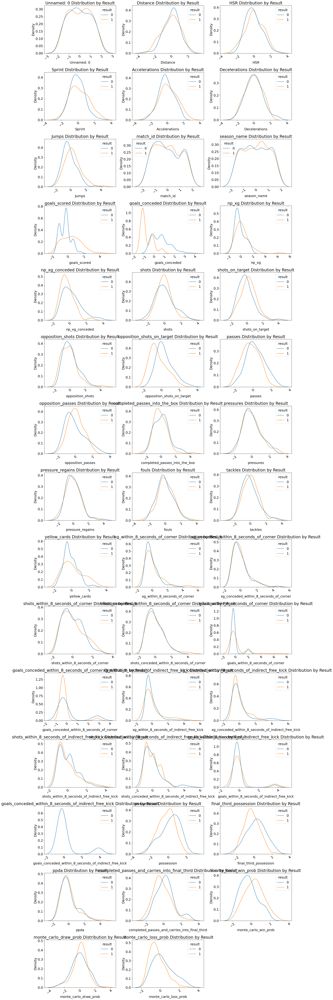

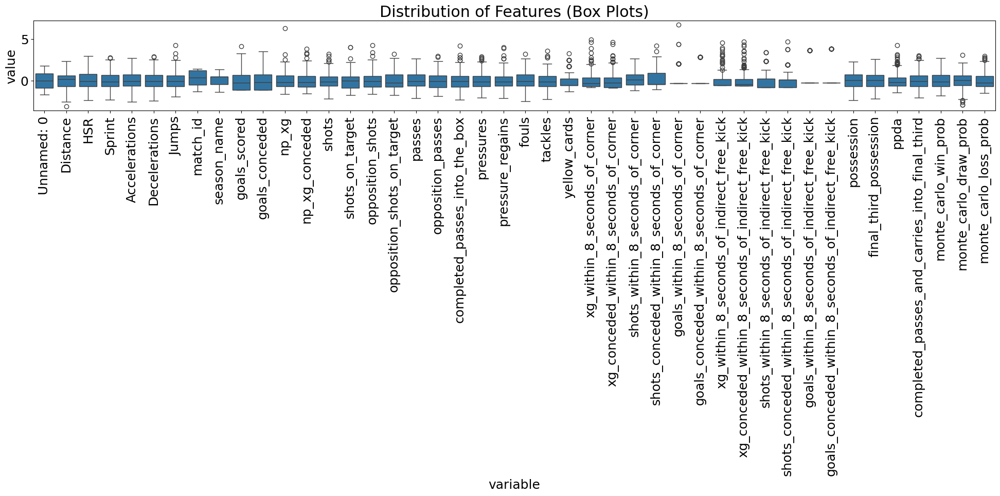

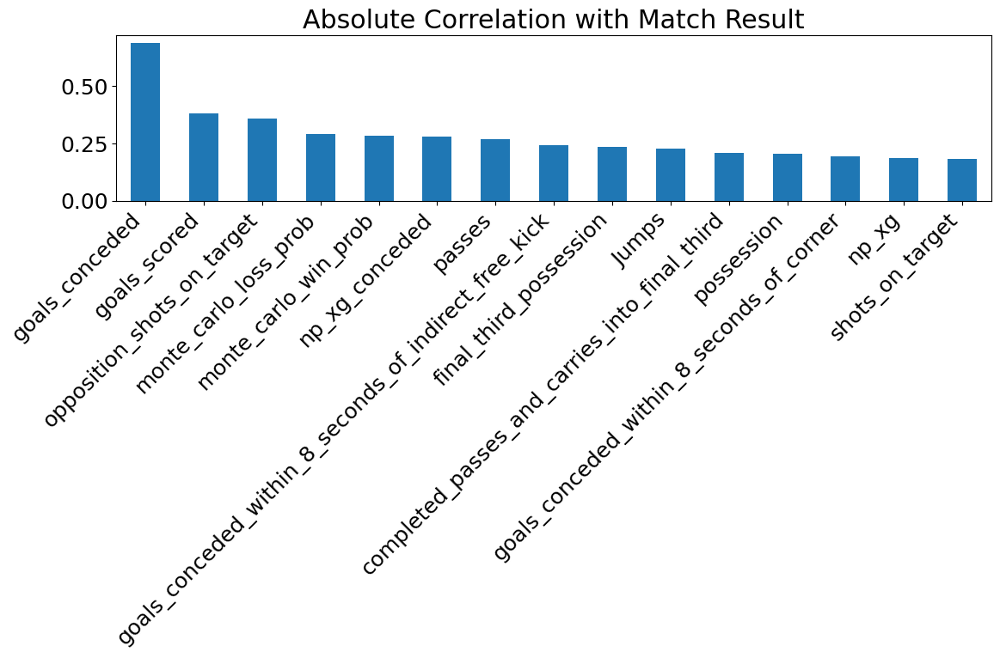

{'target_correlations': result                                                   1.000000
 goals_conceded                                           0.686847
 goals_scored                                             0.383157
 opposition_shots_on_target                               0.357759
 monte_carlo_loss_prob                                    0.293171
 monte_carlo_win_prob                                     0.284869
 np_xg_conceded                                           0.278216
 passes                                                   0.270186
 goals_conceded_within_8_seconds_of_indirect_free_kick    0.241635
 final_third_possession                                   0.234053
 Jumps                                                    0.228566
 completed_passes_and_carries_into_final_third            0.208845
 possession                                               0.204201
 goals_conceded_within_8_seconds_of_corner                0.192270
 np_xg                                 

In [18]:
create_analysis_visualizations(df)

In [19]:
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif

In [20]:
def perform_univariate_selection(x, y, feature_names, k=20):
    f_selector = SelectKBest(score_func=f_classif, k=k)
    f_selector.fit(X, y)
    f_scores = pd.DataFrame({
        'Feature': feature_names,
        'Score': f_selector.scores_,
        'F_Pvalue': f_selector.pvalues_
    })
    f_scores = f_scores.sort_values('Score', ascending=False)

    mi_selector = SelectKBest(score_func=mutual_info_classif, k=k)
    mi_selector.fit(X, y)
    mi_scores = pd.DataFrame({
        'Feature': feature_names,
        'Score': mi_selector.scores_
    })
    mi_scores = mi_scores.sort_values('Score', ascending=False)

    plt.figure(figsize=(30,16))

    plt.subplot(1, 2, 1)
    plt.barh(f_scores.head(10)['Feature'], f_scores.head(10)['Score'])
    plt.title('Top 10 Features by F-Score')
    plt.xlabel('F-Score')
    
    # Mutual Information scores plot
    plt.subplot(1, 2, 2)
    plt.barh(mi_scores.head(10)['Feature'], mi_scores.head(10)['Score'])
    plt.title('Top 10 Features by Mutual Information')
    plt.xlabel('Mutual Information Score')

    plt.tight_layout()
    plt.show()

    return f_scores, mi_scores

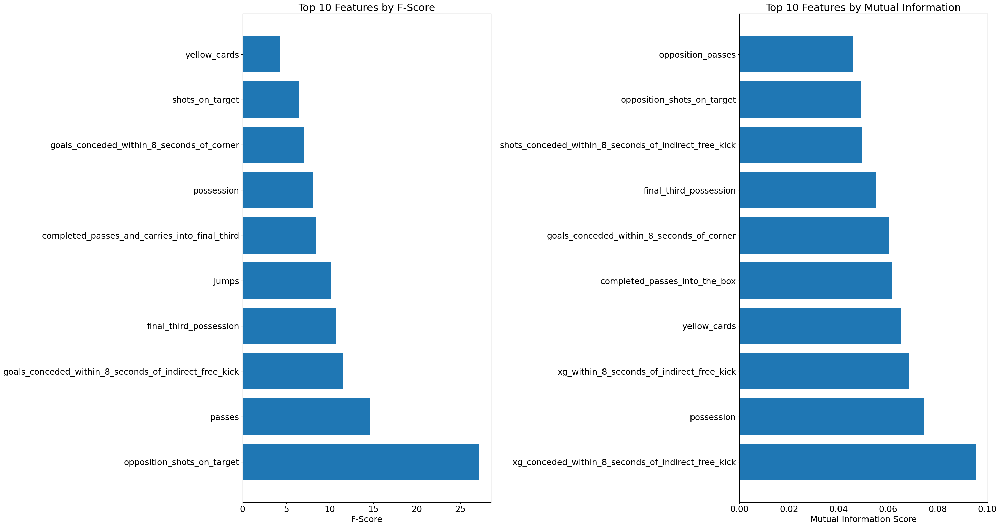

In [21]:
numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns
columns_to_remove = [
    'monte_carlo_win_prob',
    'monte_carlo_draw_prob',
    'monte_carlo_loss_prob',
    'goals_scored',
    'goals_conceded',
    'np_xg',
    'np_xg_conceded',
    'season_name',
    'Unnamed: 0',
    'result'
]
X = df[numeric_columns].drop(columns_to_remove, axis=1)
y = df['result']
feature_names = X.columns
f_scores, mi_scores = perform_univariate_selection(X, y, feature_names)


In [22]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier

In [23]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

rfe = RFE(estimator=rf_model, n_features_to_select=15)

In [24]:
X_rfe = rfe.fit_transform(X, y)

In [25]:
feature_ranks = pd.Series(rfe.ranking_, index=X.columns)
feature_ranks.sort_values(ascending=True, inplace=True)
selected_features = feature_ranks.index[:15]

In [26]:
X_selected = X[selected_features]

In [41]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.2, random_state=42)

rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.7631578947368421


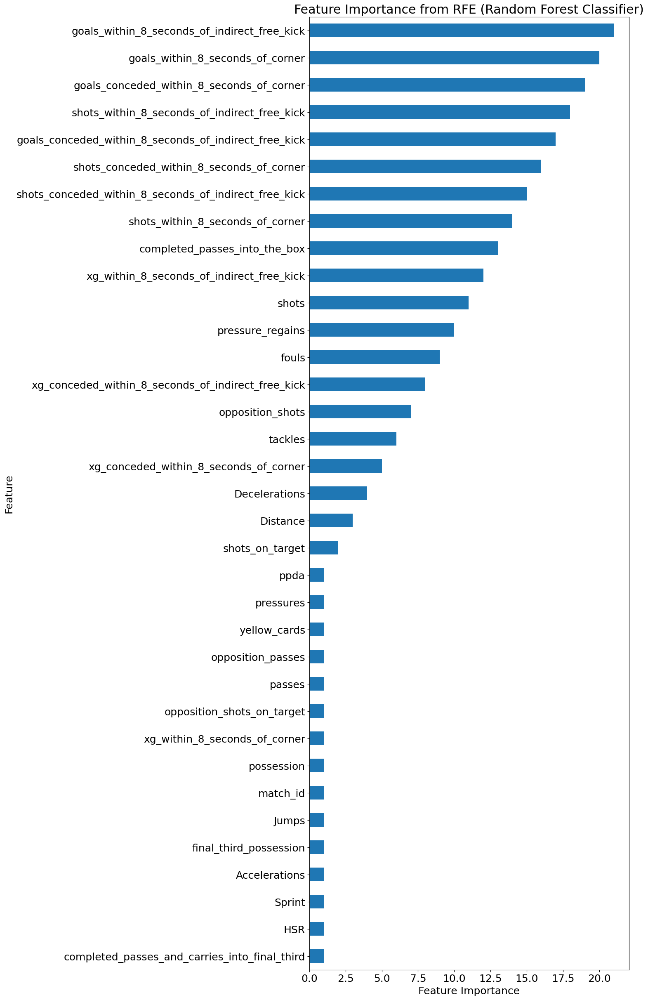

In [42]:
plt.figure(figsize=(10, 30))
feature_ranks.plot(kind='barh')
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Feature Importance from RFE (Random Forest Classifier)')
plt.show()

In [43]:
from sklearn.linear_model import LogisticRegression

In [45]:
lr_model = LogisticRegression()

In [46]:
rfe_logistic = RFE(estimator=lr_model, n_features_to_select=15)

In [47]:
X_rfe_logistic = rfe_logistic.fit_transform(X, y)

In [48]:
feature_ranks_logistic = pd.Series(rfe_logistic.ranking_, index=X.columns)
feature_ranks_logistic.sort_values(ascending=True, inplace=True)
selected_features_logistic = feature_ranks_logistic.index[:15]  # Adjust the number as needed

X_selected_logistic = X[selected_features_logistic]

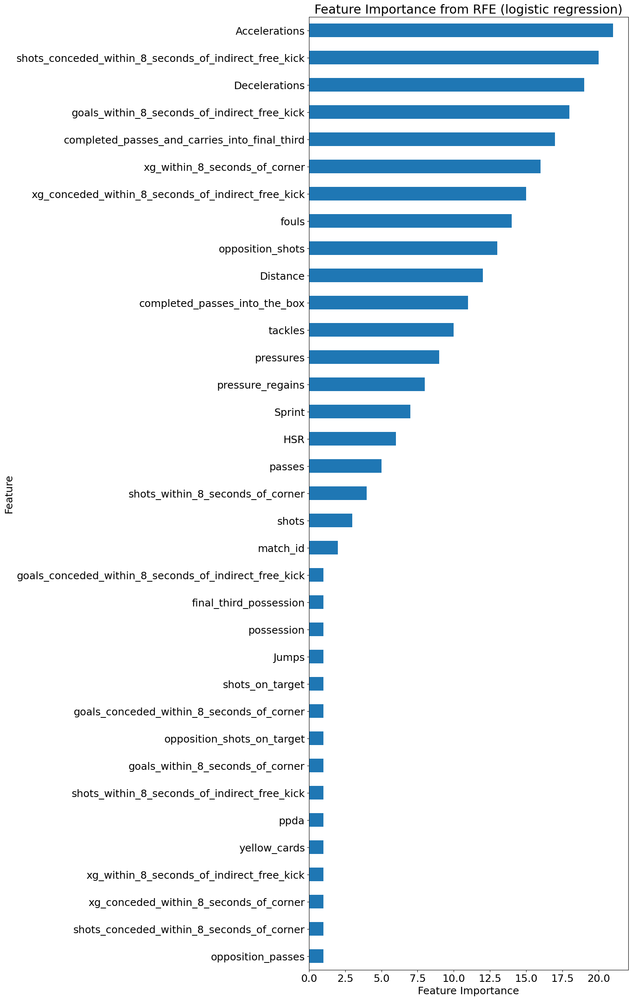

In [49]:
plt.figure(figsize=(10, 30))
feature_ranks_logistic.plot(kind='barh')
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Feature Importance from RFE (logistic regression)')
plt.show()

In [50]:
import shap

In [51]:
explainer = shap.TreeExplainer(rf_model)

In [52]:
shap_values = explainer.shap_values(X_test)

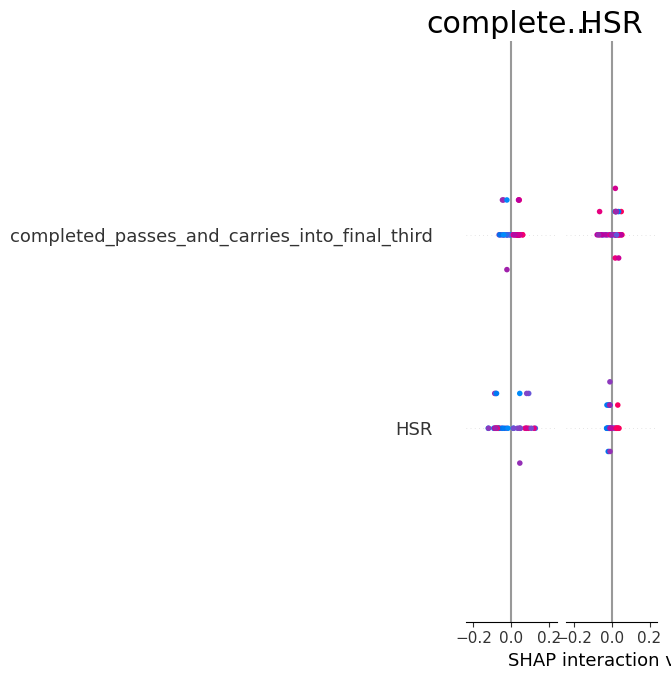

In [57]:
shap.summary_plot(shap_values, X_test)


<Figure size 1500x800 with 0 Axes>

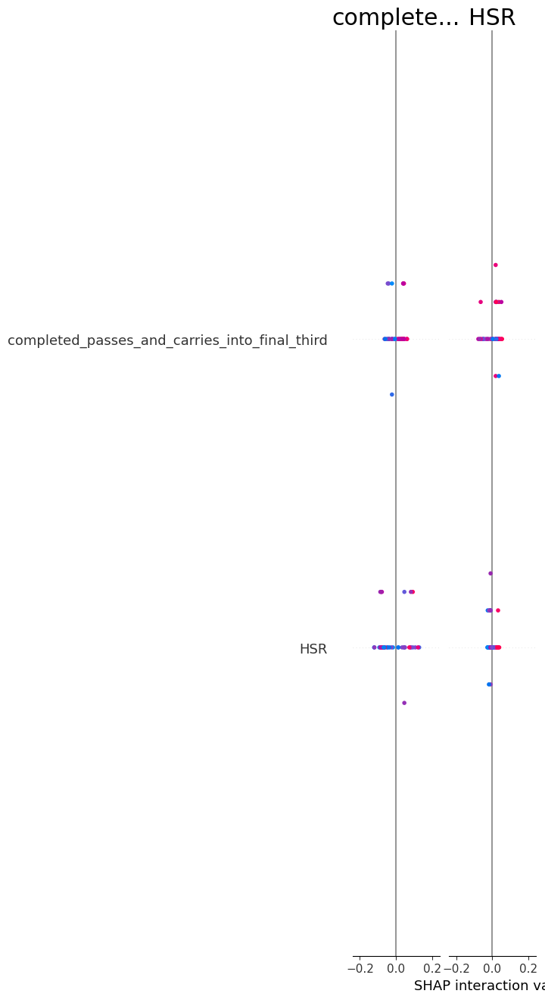

In [65]:
plt.figure(figsize=(15,8))
shap.summary_plot(shap_values, X_test, plot_type="dot", max_display=15)

In [64]:
feature_importances = pd.Series(rf_model.feature_importances_, index=X_test.columns)
print(feature_importances.sort_values(ascending=False))

opposition_shots_on_target                       0.143183
Jumps                                            0.076095
Sprint                                           0.073196
match_id                                         0.068931
passes                                           0.068394
completed_passes_and_carries_into_final_third    0.067022
yellow_cards                                     0.066695
ppda                                             0.064841
opposition_passes                                0.060040
final_third_possession                           0.058798
xg_within_8_seconds_of_corner                    0.058574
possession                                       0.052751
pressures                                        0.050173
HSR                                              0.049328
Accelerations                                    0.041980
dtype: float64


In [68]:
shap_explanation = explainer(X_test)

# Extract the values for dependence plot
shap_values_array = shap_explanation.values  # SHAP values for each feature
feature_names = X_test.columns               # Feature names

# Generate a dependence plot for a specific feature
shap.dependence_plot("opposition_shots_on_target", shap_values_array, X_test, feature_names=feature_names)


ValueError: all the input array dimensions except for the concatenation axis must match exactly, but along dimension 1, the array at index 0 has size 2 and the array at index 1 has size 3

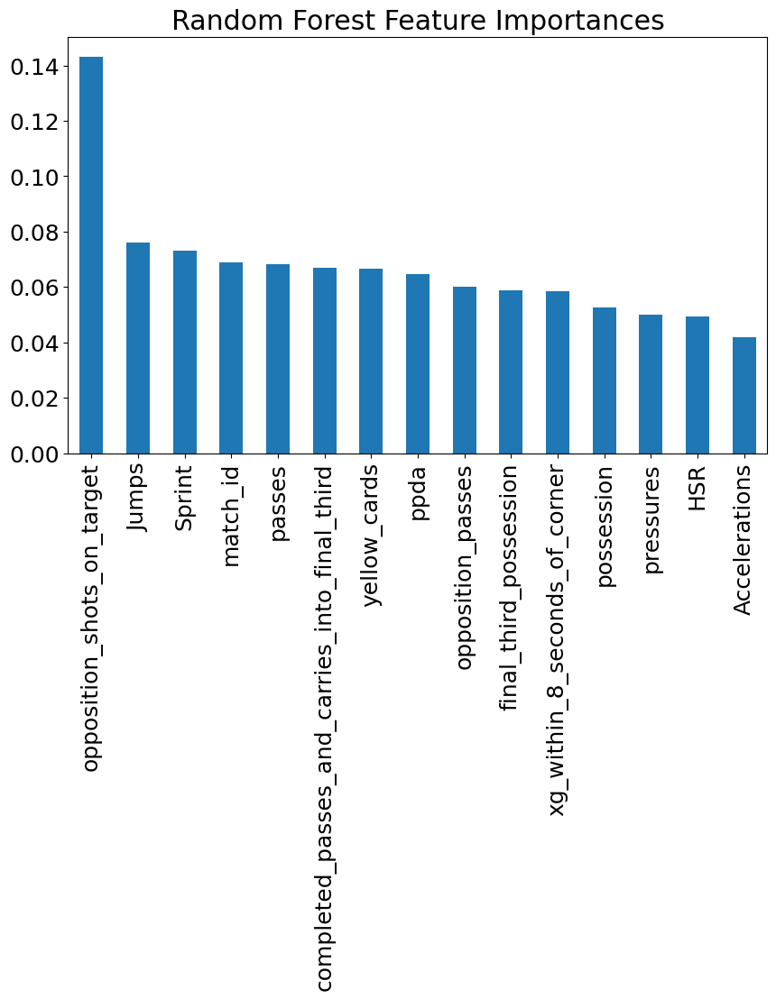

In [70]:
feature_importances = pd.Series(rf_model.feature_importances_, index=X_test.columns)
feature_importances.sort_values(ascending=False).plot(kind='bar', figsize=(10, 6))
plt.title("Random Forest Feature Importances")
plt.show()

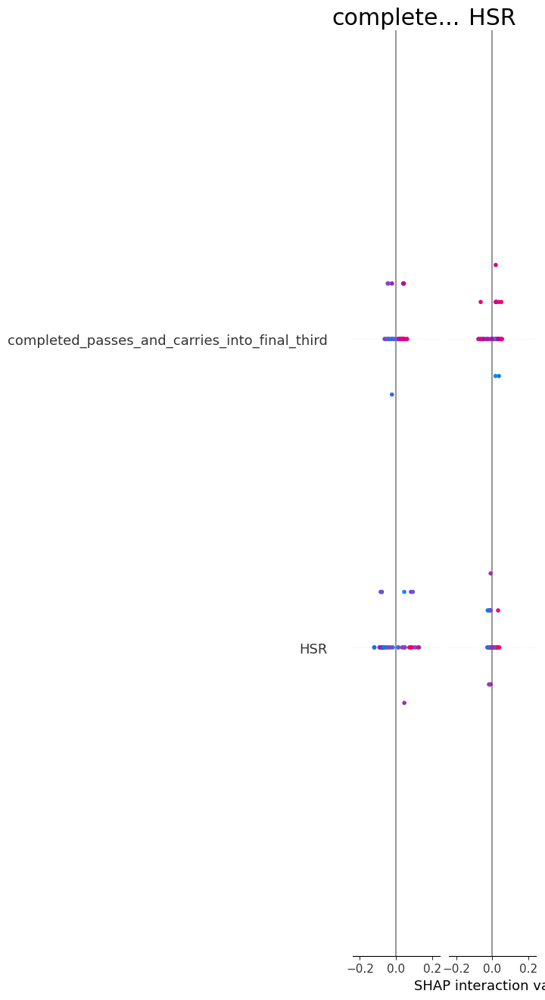

In [75]:
explainer = shap.TreeExplainer(rf_model)
shap_values = explainer.shap_values(X_test)  # This returns a list for binary classification

# Use shap_values[1] if you’re interested in SHAP values for the positive class (win)
shap.summary_plot(shap_values, X_test, plot_type="dot", max_display=15)


In [86]:
from scipy.stats import spearmanr
from sklearn.model_selection import cross_val_score

class FeatureRankingSynthesizer:
    """
    A class to synthesize multiple feature ranking methods and produce a reliable final ranking.
    """
    
    def __init__(self, method_weights=None):
        """
        Initialize the synthesizer with optional weights for different methods.
        
        Parameters:
        method_weights (dict): Weights for each method (correlation, mutual_info, logistic, rf)
        """
        self.default_weights = {
            'correlation': 1.0,
            'mutual_info': 1.2,  # Slightly higher weight for non-linear relationships
            'logistic': 1.0,
            'rf': 1.2  # Slightly higher weight for non-linear relationships
        }
        self.method_weights = method_weights if method_weights else self.default_weights
        
    def compute_all_rankings(self, X, y):
        """
        Compute rankings using all methods.
        
        Parameters:
        X (pd.DataFrame): Feature matrix
        y (pd.Series): Target variable
        
        Returns:
        pd.DataFrame: DataFrame with rankings from each method
        """
        # Standardize features
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        X_scaled = pd.DataFrame(X_scaled, columns=X.columns)
        
        rankings = {}
        
        # Correlation ranking (absolute values)
        corr_scores = []
        for feature in X.columns:
            corr = abs(spearmanr(X_scaled[feature], y)[0])
            corr_scores.append((feature, corr))
        rankings['correlation'] = self._scores_to_ranks(corr_scores)
        
        # Mutual Information ranking
        mi_scores = mutual_info_classif(X_scaled, y)
        mi_scores = [(feature, score) for feature, score in zip(X.columns, mi_scores)]
        rankings['mutual_info'] = self._scores_to_ranks(mi_scores)
        
        # Logistic Regression ranking
        lr = LogisticRegression(max_iter=1000)
        lr.fit(X_scaled, y)
        lr_scores = [(feature, abs(coef)) for feature, coef 
                     in zip(X.columns, lr.coef_[0])]
        rankings['logistic'] = self._scores_to_ranks(lr_scores)
        
        # Random Forest ranking
        rf = RandomForestClassifier(n_estimators=100, random_state=42)
        rf.fit(X_scaled, y)
        rf_scores = [(feature, importance) for feature, importance 
                     in zip(X.columns, rf.feature_importances_)]
        rankings['rf'] = self._scores_to_ranks(rf_scores)
        
        return pd.DataFrame(rankings, index=X.columns)
    
    def _scores_to_ranks(self, scores):
        """Convert scores to ranks (higher score = lower rank number)"""
        sorted_features = sorted(scores, key=lambda x: x[1], reverse=True)
        return {feature: rank + 1 for rank, (feature, _) in enumerate(sorted_features)}
    
    def compute_borda_count(self, rankings_df):
        """
        Compute Borda count for each feature.
        """
        n_features = len(rankings_df)
        borda_scores = {}
        
        for feature in rankings_df.index:
            score = 0
            for method in rankings_df.columns:
                # Higher ranks (lower numbers) get more points
                score += (n_features - rankings_df.loc[feature, method] + 1) * self.method_weights[method]
            borda_scores[feature] = score
            
        return pd.Series(borda_scores).sort_values(ascending=False)
    
    def get_consensus_features(self, rankings_df, threshold_percentile=30):
        """
        Get features that consistently appear in the top threshold_percentile across methods.
        """
        n_features = len(rankings_df)
        threshold_rank = int(n_features * threshold_percentile / 100)
        
        consensus_features = []
        for feature in rankings_df.index:
            top_ranks_count = sum(1 for method in rankings_df.columns 
                                if rankings_df.loc[feature, method] <= threshold_rank)
            if top_ranks_count >= len(rankings_df.columns) / 2:  # Present in at least half the methods
                consensus_features.append(feature)
                
        return consensus_features
    
    def compute_stability_score(self, X, y, feature, n_splits=5):
        """
        Compute stability score for a feature using cross-validation.
        """
        rf = RandomForestClassifier(n_estimators=50, random_state=42)
        scores = cross_val_score(rf, X[[feature]], y, cv=n_splits)
        return np.mean(scores), np.std(scores)
    
    def get_final_ranking(self, X, y, top_k=None, stability_check=True):
        """
        Generate final feature ranking synthesis.
        
        Parameters:
        X (pd.DataFrame): Feature matrix
        y (pd.Series): Target variable
        top_k (int): Number of top features to return
        stability_check (bool): Whether to perform stability check
        
        Returns:
        pd.DataFrame: Final ranking with various metrics
        """
        # Get all rankings
        rankings_df = self.compute_all_rankings(X, y)
        
        # Compute average ranks
        avg_ranks = rankings_df.mean(axis=1)
        
        # Compute Borda counts
        borda_scores = self.compute_borda_count(rankings_df)
        
        # Get consensus features
        consensus_features = self.get_consensus_features(rankings_df)
        
        # Create final ranking DataFrame
        final_ranking = pd.DataFrame({
            'average_rank': avg_ranks,
            'borda_score': borda_scores,
            'in_consensus': [feat in consensus_features for feat in rankings_df.index]
        })
        
        # Add stability scores if requested
        if stability_check:
            stability_scores = []
            stability_stds = []
            for feature in rankings_df.index:
                mean_score, std_score = self.compute_stability_score(X, y, feature)
                stability_scores.append(mean_score)
                stability_stds.append(std_score)
            final_ranking['stability_score'] = stability_scores
            final_ranking['stability_std'] = stability_stds
        
        # Sort by Borda score and select top k if specified
        final_ranking = final_ranking.sort_values('borda_score', ascending=False)
        if top_k:
            final_ranking = final_ranking.head(top_k)
        
        return final_ranking

In [87]:
custom_weights = {
    'correlation': 1.0,
    'mutual_info': 1.2,
    'logistic': 1.0,
    'rf': 1.2
}
synthesizer = FeatureRankingSynthesizer(method_weights=custom_weights)

# Get final ranking
final_ranking = synthesizer.get_final_ranking(X, y, top_k=10, stability_check=True)

In [88]:
print(final_ranking)

                                                    average_rank  borda_score  \
opposition_shots_on_target                                  1.00        154.0   
final_third_possession                                      5.50        134.2   
possession                                                  7.75        124.4   
opposition_passes                                           8.00        123.0   
yellow_cards                                               10.00        115.8   
passes                                                     10.75        111.4   
Jumps                                                      10.50        111.2   
goals_conceded_within_8_seconds_of_indirect_fre...         10.25        110.2   
Sprint                                                     12.50        105.6   
shots_on_target                                            12.25        101.6   

                                                    in_consensus  \
opposition_shots_on_target              